<a href="https://colab.research.google.com/github/aalr007/VisionComputacional/blob/main/Fourier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from math import sqrt,exp
from scipy.signal import fftconvolve
from scipy.fftpack import fft2, ifft2, fftshift, ifftshift
from scipy.ndimage import gaussian_filter

In [ ]:
from google.colab import files
from IPython.display import Image

uploaded = files.upload()

Saving Perry.png to Perry.png


In [ ]:
#Funciones de Visualizacion
def surface_plot (matrix, **kwargs):
  (x,y) = np.meshgrid(np.arange(matrix.shape[1],np.arange(matrix.shape[0])))
  fig = plt.figure()
  ax = fig.add_subplot(111,projection='3d')
  surf = ax.plot_surface(x,y,matrix, **kwargs)
  return (fig, ax,surf)

def plot_spectrum(X_ft, centered = True):
  if centered:
    X_ftc = fftshift(X_ft)
  else:
    X_ftc = X_ft
  plt.imshow(np.abs(X_ftc), norm = LogNorm(vmin=5))
  plt.colorbar()

In [ ]:
# Lectura de la imagen
X = cv2.imread('Perry.png',0)

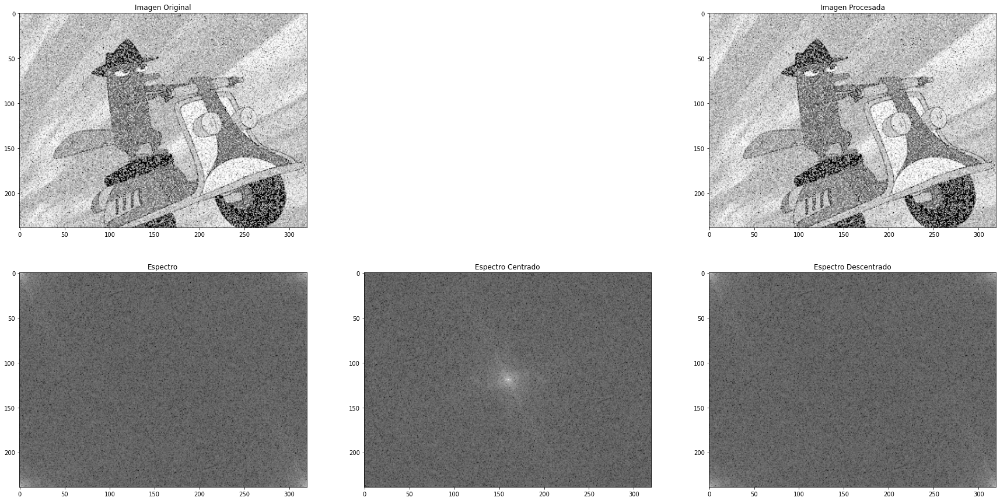

In [ ]:
plt.figure(figsize=(30,15))

plt.subplot(231), plt.imshow(X,'gray'), plt.title('Imagen Original')

X_ft = fft2(X)
plt.subplot(234), plt.imshow(np.log(1 + np.abs(X_ft)),'gray'), plt.title('Espectro')

X_ftc = fftshift(X_ft)
plt.subplot(235), plt.imshow(np.log(1 + np.abs(X_ftc)),'gray'), plt.title('Espectro Centrado')

X_ft_inv = ifftshift(X_ftc)
plt.subplot(236), plt.imshow(np.log(1 + np.abs(X_ft_inv)),'gray'), plt.title('Espectro Descentrado')

X_new = ifft2(X_ft_inv)
plt.subplot(233), plt.imshow(np.abs(X_new),'gray'), plt.title('Imagen Procesada')

plt.show()

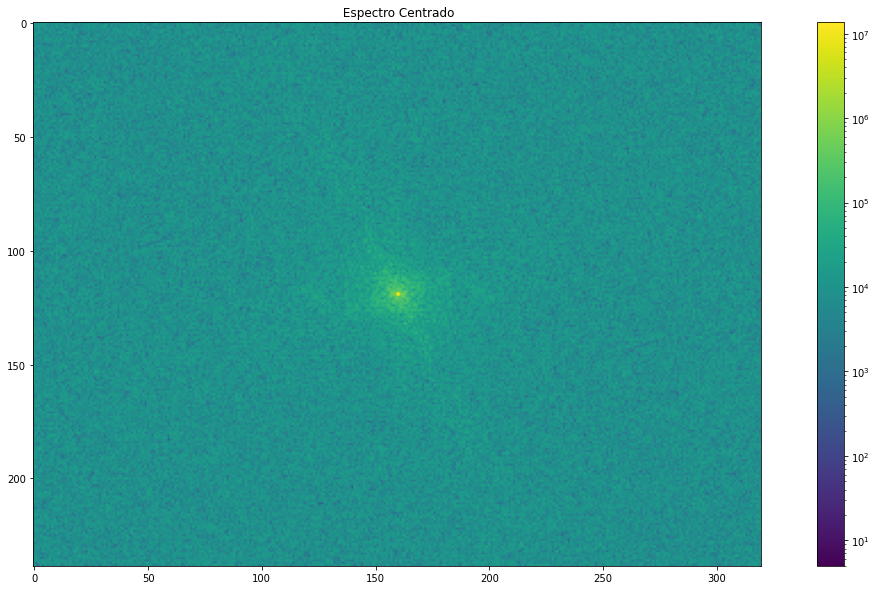

In [ ]:
# Representacion a color

plt.figure(figsize=(20,10))
plot_spectrum(X_ft)
plt.title(' Espectro Centrado')
plt.show()

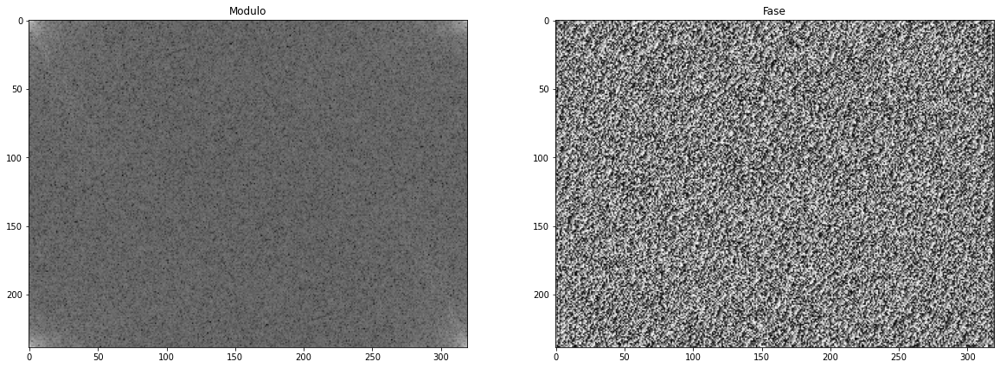

In [ ]:
#Modulo y fase
plt.figure(figsize =(20,8))

plt.subplot(121), plt.imshow(np.log(np.abs(X_ft)),'gray'), plt.title('Modulo')

plt.subplot(122), plt.imshow(np.angle(X_ft),'gray'),plt.title('Fase')

plt.show()

In [ ]:
#Frecuencia de corte

D0 = 50

In [ ]:
# Funciones
def distance(point1,point2):
    return sqrt((point1[0]-point2[0])**2 + (point1[1]-point2[1])**2)

def idealFilterLP(D0,imgShape):
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            if distance((y,x),center) < D0:
                base[y,x] = 1
    return base

def idealFilterHP(D0,imgShape):
    base = np.ones(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            if distance((y,x),center) < D0:
                base[y,x] = 0
    return base

def butterworthLP(D0,imgShape,n):
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            base[y,x] = 1/(1+(distance((y,x),center)/D0)**(2*n))
    return base

def butterworthHP(D0,imgShape,n):
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            base[y,x] = 1-1/(1+(distance((y,x),center)/D0)**(2*n))
    return base

def gaussianLP(D0,imgShape):
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            base[y,x] = exp(((-distance((y,x),center)**2)/(2*(D0**2))))
    return base

def gaussianHP(D0,imgShape):
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            base[y,x] = 1 - exp(((-distance((y,x),center)**2)/(2*(D0**2))))
    return base

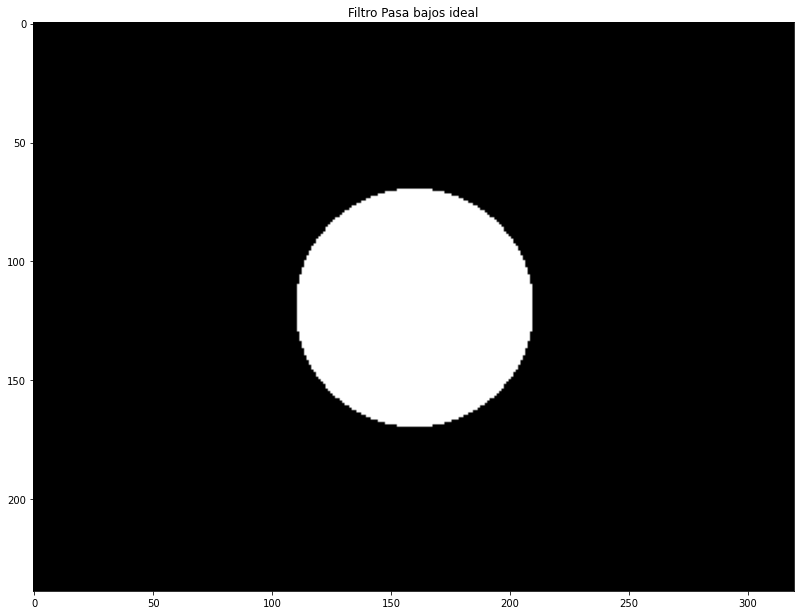

In [ ]:
#Filtro Ideal

plt.figure(figsize = (30,15))

LowPass = idealFilterLP(D0,X.shape)
plt.subplot(121), plt.imshow(LowPass,'gray'), plt.title('Filtro Pasa bajos ideal')
#surface_plot(LowPass, cmap = plt.cm.coolwarm)
plt.show()

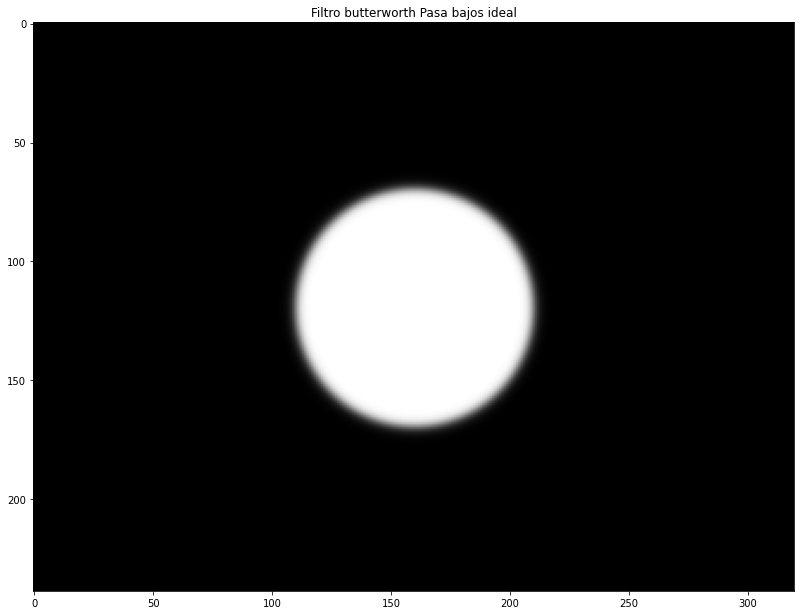

In [ ]:
#Filtro butterworth

plt.figure(figsize = (30,15))

LowPass = butterworthLP(D0,X.shape,20)
plt.subplot(121), plt.imshow(LowPass,'gray'), plt.title('Filtro butterworth Pasa bajos ideal')
#surface_plot(LowPass, cmap = plt.cm.coolwarm)
plt.show()

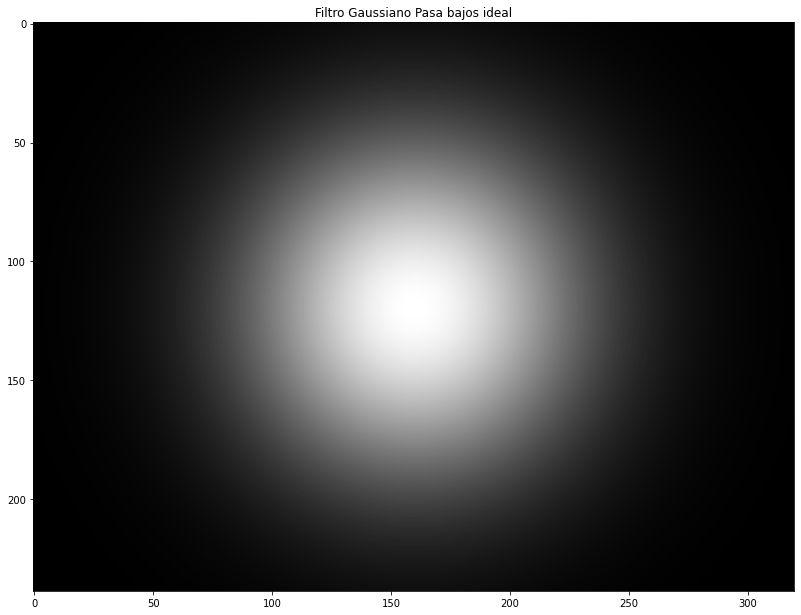

In [ ]:
#Filtro Gaussiano

plt.figure(figsize = (30,15))

LowPass = gaussianLP(D0,X.shape)
plt.subplot(121), plt.imshow(LowPass,'gray'), plt.title('Filtro Gaussiano Pasa bajos ideal')
#surface_plot(LowPass, cmap = plt.cm.coolwarm)
plt.show()

Gaussiano


(<matplotlib.axes._subplots.AxesSubplot at 0x7f2a6e6bf3d0>,
 Text(0.5, 1.0, 'Imagen procesada'))

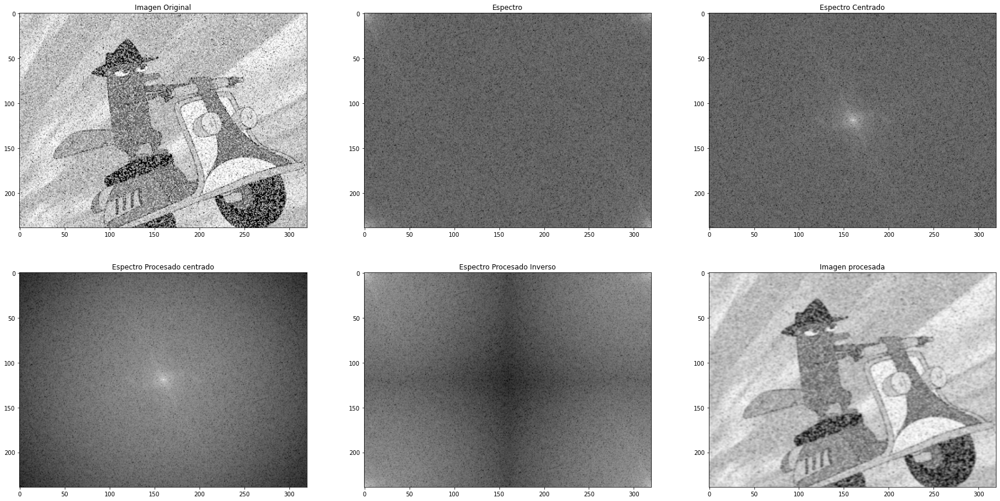

In [ ]:
# Ejemplos

lp = 2
filtro = 3
D0 = 60
n = 20


if filtro == 1:
  H = idealFilterLP(D0,X.shape)
  print('Ideal')


elif filtro == 2:
  H = butterworthLP(D0,X.shape,n)
  print('butterworth')


elif filtro == 3:
  H = gaussianLP(D0,X.shape)
  print('Gaussiano')

plt.figure(figsize=(30,15))

plt.subplot(231), plt.imshow(X,'gray'), plt.title('Imagen Original')

X_ft = fft2(X)
plt.subplot(232), plt.imshow(np.log(1 + np.abs(X_ft)),'gray'), plt.title('Espectro')

X_ftc = fftshift(X_ft)
plt.subplot(233), plt.imshow(np.log(1 + np.abs(X_ftc)),'gray'), plt.title('Espectro Centrado')

Y_ftc = X_ftc * H
plt.subplot(234), plt.imshow(np.log(1 + np.abs(Y_ftc)),'gray'), plt.title('Espectro Procesado centrado')

Y_ftc_inv = ifftshift(Y_ftc)
plt.subplot(235), plt.imshow(np.log(1 + np.abs(Y_ftc_inv)),'gray'), plt.title('Espectro Procesado Inverso')


Y = ifft2(Y_ftc_inv)
plt.subplot(236), plt.imshow(np.abs(Y),'gray'), plt.title('Imagen procesada')

In [ ]:
uploaded = files.upload()

Saving Chica.png to Chica.png


In [ ]:
C = cv2.imread('Chica.png',0)

butterworth


(<matplotlib.axes._subplots.AxesSubplot at 0x7f2a6b2d9250>,
 Text(0.5, 1.0, 'Imagen procesada'))

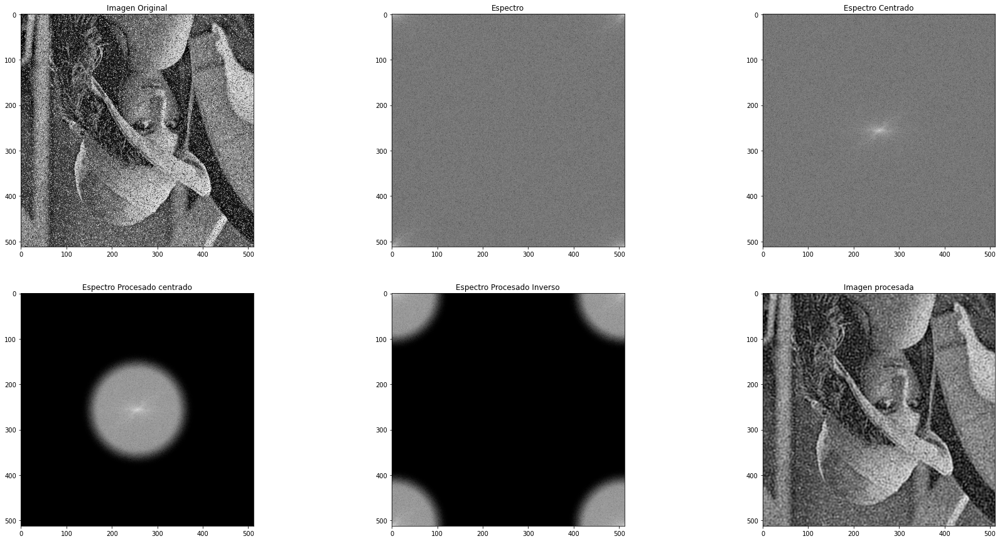

In [ ]:
# Ejemplos

lp = 2
filtro = 2
D0 = 90
n = 20


if filtro == 1:
  H = idealFilterLP(D0,C.shape)
  print('Ideal')


elif filtro == 2:
  H = butterworthLP(D0,C.shape,n)
  print('butterworth')


elif filtro == 3:
  H = gaussianLP(D0,C.shape)
  print('Gaussiano')

plt.figure(figsize=(30,15))

plt.subplot(231), plt.imshow(C,'gray'), plt.title('Imagen Original')

X_ft = fft2(C)
plt.subplot(232), plt.imshow(np.log(1 + np.abs(X_ft)),'gray'), plt.title('Espectro')

X_ftc = fftshift(X_ft)
plt.subplot(233), plt.imshow(np.log(1 + np.abs(X_ftc)),'gray'), plt.title('Espectro Centrado')

Y_ftc = X_ftc * H
plt.subplot(234), plt.imshow(np.log(1 + np.abs(Y_ftc)),'gray'), plt.title('Espectro Procesado centrado')

Y_ftc_inv = ifftshift(Y_ftc)
plt.subplot(235), plt.imshow(np.log(1 + np.abs(Y_ftc_inv)),'gray'), plt.title('Espectro Procesado Inverso')


Y = ifft2(Y_ftc_inv)
plt.subplot(236), plt.imshow(np.abs(Y),'gray'), plt.title('Imagen procesada')

In [ ]:
uploaded = files.upload()

Saving moonlanding.png to moonlanding.png


In [ ]:
B = cv2.imread('moonlanding.png',0)

butterworth


(<matplotlib.axes._subplots.AxesSubplot at 0x7f2a6c03cfd0>,
 Text(0.5, 1.0, 'Imagen procesada'))

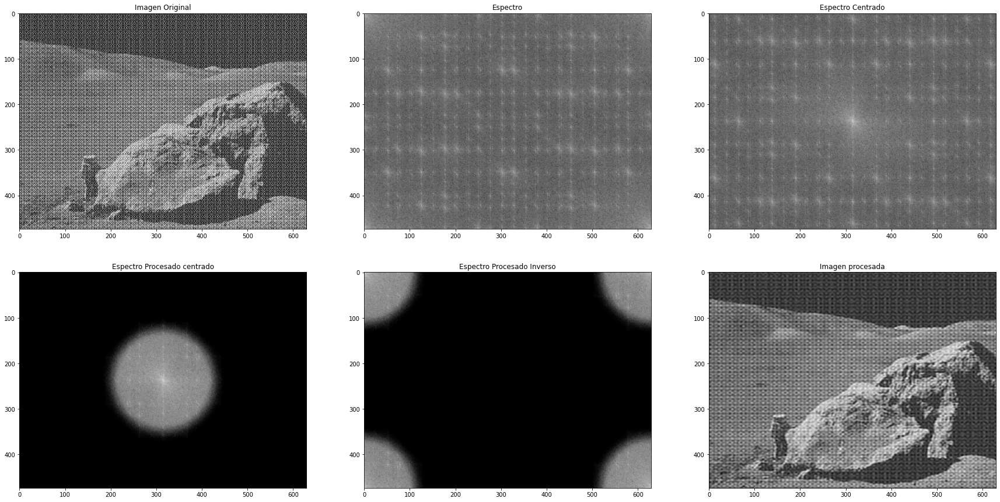

In [ ]:
# Ejemplos

lp = 1
filtro = 2
D0 = 100
n = 20


if filtro == 1:
  H = idealFilterLP(D0,B.shape)
  print('Ideal')


elif filtro == 2:
  H = butterworthLP(D0,B.shape,n)
  print('butterworth')


elif filtro == 3:
  H = gaussianLP(D0,C.shape)
  print('Gaussiano')

if lp==2:
  H = 1-H
  

plt.figure(figsize=(30,15))

plt.subplot(231), plt.imshow(B,'gray'), plt.title('Imagen Original')

X_ft = fft2(B)
plt.subplot(232), plt.imshow(np.log(1 + np.abs(X_ft)),'gray'), plt.title('Espectro')

X_ftc = fftshift(X_ft)
plt.subplot(233), plt.imshow(np.log(1 + np.abs(X_ftc)),'gray'), plt.title('Espectro Centrado')

Y_ftc = X_ftc * H
plt.subplot(234), plt.imshow(np.log(1 + np.abs(Y_ftc)),'gray'), plt.title('Espectro Procesado centrado')

Y_ftc_inv = ifftshift(Y_ftc)
plt.subplot(235), plt.imshow(np.log(1 + np.abs(Y_ftc_inv)),'gray'), plt.title('Espectro Procesado Inverso')


Y = ifft2(Y_ftc_inv)
plt.subplot(236), plt.imshow(np.abs(Y),'gray'), plt.title('Imagen procesada')

In [ ]:
#Filtro pasa altas

In [ ]:
uploaded = files.upload()

Saving Ilusion2.png to Ilusion2.png


In [ ]:
B = cv2.imread('Ilusion2.png',0)

butterworth


(<matplotlib.axes._subplots.AxesSubplot at 0x7f2a6b67c130>,
 Text(0.5, 1.0, 'Imagen procesada'))

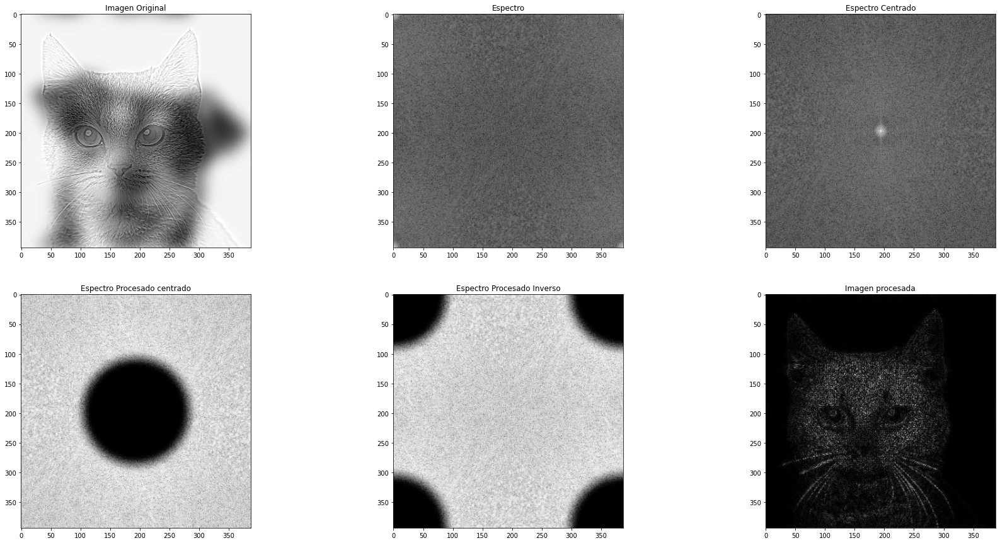

In [ ]:

lp = 2
filtro = 2
D0 = 100
n = 20


if filtro == 1:
  H = idealFilterLP(D0,B.shape)
  print('Ideal')


elif filtro == 2:
  H = butterworthLP(D0,B.shape,n)
  print('butterworth')


elif filtro == 3:
  H = gaussianLP(D0,C.shape)
  print('Gaussiano')

if lp==2:
  H = 1-H
  

plt.figure(figsize=(30,15))

plt.subplot(231), plt.imshow(B,'gray'), plt.title('Imagen Original')

X_ft = fft2(B)
plt.subplot(232), plt.imshow(np.log(1 + np.abs(X_ft)),'gray'), plt.title('Espectro')

X_ftc = fftshift(X_ft)
plt.subplot(233), plt.imshow(np.log(1 + np.abs(X_ftc)),'gray'), plt.title('Espectro Centrado')

Y_ftc = X_ftc * H
plt.subplot(234), plt.imshow(np.log(1 + np.abs(Y_ftc)),'gray'), plt.title('Espectro Procesado centrado')

Y_ftc_inv = ifftshift(Y_ftc)
plt.subplot(235), plt.imshow(np.log(1 + np.abs(Y_ftc_inv)),'gray'), plt.title('Espectro Procesado Inverso')


Y = ifft2(Y_ftc_inv)
plt.subplot(236), plt.imshow(np.abs(Y),'gray'), plt.title('Imagen procesada')

In [ ]:
uploaded = files.upload()

Saving Fantasma.png to Fantasma.png


In [ ]:
B = cv2.imread('Fantasma.png',0)

butterworth


(<matplotlib.axes._subplots.AxesSubplot at 0x7f2a6aa2d220>,
 Text(0.5, 1.0, 'Imagen procesada'))

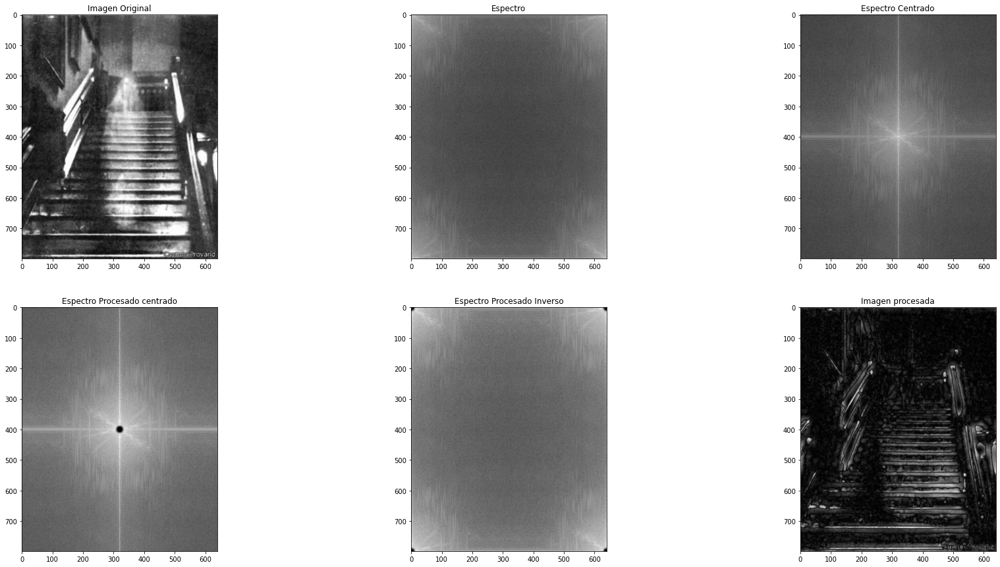

In [ ]:

lp = 2
filtro = 2
D0 = 15
n = 10


if filtro == 1:
  H = idealFilterLP(D0,B.shape)
  print('Ideal')


elif filtro == 2:
  H = butterworthLP(D0,B.shape,n)
  print('butterworth')


elif filtro == 3:
  H = gaussianLP(D0,C.shape)
  print('Gaussiano')

if lp==2:
  H = 1-H
  

plt.figure(figsize=(30,15))

plt.subplot(231), plt.imshow(B,'gray'), plt.title('Imagen Original')

X_ft = fft2(B)
plt.subplot(232), plt.imshow(np.log(1 + np.abs(X_ft)),'gray'), plt.title('Espectro')

X_ftc = fftshift(X_ft)
plt.subplot(233), plt.imshow(np.log(1 + np.abs(X_ftc)),'gray'), plt.title('Espectro Centrado')

Y_ftc = X_ftc * H
plt.subplot(234), plt.imshow(np.log(1 + np.abs(Y_ftc)),'gray'), plt.title('Espectro Procesado centrado')

Y_ftc_inv = ifftshift(Y_ftc)
plt.subplot(235), plt.imshow(np.log(1 + np.abs(Y_ftc_inv)),'gray'), plt.title('Espectro Procesado Inverso')


Y = ifft2(Y_ftc_inv)
plt.subplot(236), plt.imshow(np.abs(Y),'gray'), plt.title('Imagen procesada')

In [ ]:
uploaded = files.upload()

Saving Fantasma2.png to Fantasma2 (2).png


In [ ]:
B = cv2.imread('Fantasma2.png',0)

Ideal


(<matplotlib.axes._subplots.AxesSubplot at 0x7f2a6a188280>,
 Text(0.5, 1.0, 'Imagen procesada'))

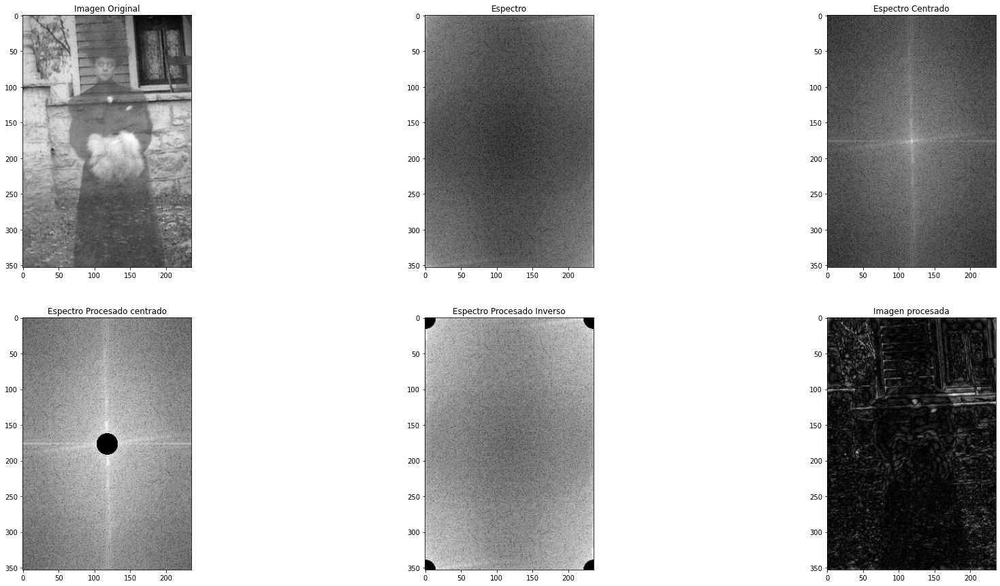

In [ ]:

lp = 2
filtro = 1
D0 = 15
n = 30


if filtro == 1:
  H = idealFilterLP(D0,B.shape)
  print('Ideal')


elif filtro == 2:
  H = butterworthLP(D0,B.shape,n)
  print('butterworth')


elif filtro == 3:
  H = gaussianLP(D0,C.shape)
  print('Gaussiano')

if lp==2:
  H = 1-H
  

plt.figure(figsize=(30,15))

plt.subplot(231), plt.imshow(B,'gray'), plt.title('Imagen Original')

X_ft = fft2(B)
plt.subplot(232), plt.imshow(np.log(1 + np.abs(X_ft)),'gray'), plt.title('Espectro')

X_ftc = fftshift(X_ft)
plt.subplot(233), plt.imshow(np.log(1 + np.abs(X_ftc)),'gray'), plt.title('Espectro Centrado')

Y_ftc = X_ftc * H
plt.subplot(234), plt.imshow(np.log(1 + np.abs(Y_ftc)),'gray'), plt.title('Espectro Procesado centrado')

Y_ftc_inv = ifftshift(Y_ftc)
plt.subplot(235), plt.imshow(np.log(1 + np.abs(Y_ftc_inv)),'gray'), plt.title('Espectro Procesado Inverso')


Y = ifft2(Y_ftc_inv)
plt.subplot(236), plt.imshow(np.abs(Y),'gray'), plt.title('Imagen procesada')